In [8]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from siphon.catalog import TDSCatalog
import metpy.calc as mpcalc
from scipy.ndimage import gaussian_filter
import time
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

In [17]:
def find_time_var(var, time_basename='time'):
    for coord_name in var.coords:
        if coord_name.startswith(time_basename):
            return var.coords[coord_name]
    raise ValueError('No time variable found for ' + var.name)

def find_press_var(var, time_basename='isobaric'):
    for coord_name in var.coords:
        if coord_name.startswith(time_basename):
            return var.coords[coord_name]
    raise ValueError('No time variable found for ' + var.name)

def gfs_data(directions): 
    tds_gfs = TDSCatalog('https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/latest.html')
    gfs_ds = tds_gfs.datasets[0]
    ds = xr.open_dataset(gfs_ds.access_urls['OPENDAP'])
    ds_latlon = ds.sel(lat=slice(directions['North'], directions['South']), lon=slice(directions['West'], directions['East']))

    dims_to_keep = ['lat', 'lon', 'time', 'time1', 'time2', 'time3', 'isobaric']

    ds_latlon = ds_latlon.drop_dims([dim for dim in ds_latlon.dims if dim not in dims_to_keep])

    time_dim = find_time_var(ds_latlon['Temperature_isobaric'])
    iso_dim = find_press_var(ds_latlon['Temperature_isobaric'])

    init_time = time_dim[0].values

    target_length = len(time_dim) 

    # Initialize a variable to store the matching dimension name
    matching_dim = None

    # Loop over the dimensions and check their lengths
    for dim, size in ds_latlon.dims.items():
        if size == target_length:
            matching_dim = dim
            break  # Exit loop once a match is found 
    
    return ds_latlon, matching_dim, init_time

def base_map(directions):
    fig, ax = plt.subplots(figsize=(12, 9), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([directions['West'], directions['East'], directions['South'], directions['North']-5])
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor='gray', linewidth=0.5)
    ax.add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=0.5)
    ax.add_feature(cfeature.OCEAN, color='white')
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.add_feature(cfeature.LAND, color='#fbf5e9')
    
    # Add gridlines and format longitude/latitude labels
    gls = ax.gridlines(draw_labels=True, color='black', linestyle='--', alpha=0.35)
    gls.top_labels = False
    gls.right_labels = False
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    
    return fig, ax

def plot_maxmin_points(lon, lat, data, extrema, nsize, symbol, color='k',
                       plotValue=True, transform=None, ax=None, threshold=0.5):
    from scipy.ndimage import maximum_filter, minimum_filter

    if ax is None:
        ax = plt.gca()

    if extrema == 'max':
        data_ext = maximum_filter(data, nsize, mode='nearest')
    elif extrema == 'min':
        data_ext = minimum_filter(data, nsize, mode='nearest')
    else:
        raise ValueError('Value for extrema must be either max or min')

    mxy, mxx = np.where(data_ext == data)

    # To keep track of unique points
    plotted_points = []

    for i in range(len(mxy)):
        lon_coord = lon[mxx[i]].item()
        lat_coord = lat[mxy[i]].item()
        
        # Check distance from already plotted points
        if not any(np.sqrt((lon_coord - lon_p)**2 + (lat_coord - lat_p)**2) < threshold for lon_p, lat_p in plotted_points):
            ax.text(lon_coord, lat_coord, symbol, color=color, size=24,
                    clip_on=True, clip_box=ax.bbox, horizontalalignment='center', 
                    verticalalignment='center', transform=transform)
            ax.text(lon_coord, lat_coord, 
                    '\n' + str(int(data[mxy[i], mxx[i]])), 
                    color=color, size=12, clip_on=True, clip_box=ax.bbox, 
                    fontweight='bold', horizontalalignment='center', 
                    verticalalignment='top', transform=transform)

            # Mark this point as plotted
            plotted_points.append((lon_coord, lat_coord))

def plot_ivt(ds_latlon, matching_dim, init_time, directions): 
    for i in range(0, 29):
        iteration_start = time.time()
        ds = ds_latlon.isel(**{matching_dim: i})

        u = ds['u-component_of_wind_isobaric'].sel(isobaric=slice(30000, 100000)) # units m/s
        v = ds['v-component_of_wind_isobaric'].sel(isobaric=slice(30000, 100000)) # units m/s
        q = ds['Specific_humidity_isobaric'].sel(isobaric=slice(30000, 100000)) # units kg/kg
        mslp = ds['MSLP_Eta_model_reduction_msl'] / 100 # units hPa 
        pressure_levels = u['isobaric'].values[::-1] # units Pa
        g = 9.81 # units m/s^2
        lats, lons = u['lat'], u['lon']

        u_ivt = (-1 / g) * np.trapz(u * q, pressure_levels, axis=0) # units kg/(m s)
        v_ivt = (-1 / g) * np.trapz(v * q, pressure_levels, axis=0) # units kg/(m s)
        ivt = np.sqrt(u_ivt**2 + v_ivt**2) # units kg/(m s)
        ivt_da = xr.DataArray(ivt, dims=['lat', 'lon'], coords={'lat': lats, 'lon': lons})

        levels = [250, 300, 400, 500, 600, 700, 800, 1000, 1200, 1400, 1600]
        colors = ['#ffff00', '#ffe400', '#ffc800', '#ffad00', '#ff8200', '#ff5000', '#ff1e00', '#eb0010', '#b8003a', '#850063', '#570088']
        cmap = mcolors.ListedColormap(colors)
        norm = mcolors.BoundaryNorm(levels, cmap.N)

        mslp_smoothed = gaussian_filter(mslp, sigma=3)
        u_ivt_smoothed = gaussian_filter(u_ivt, sigma=3)
        v_ivt_smoothed = gaussian_filter(v_ivt, sigma=3)
        ivt_smoothed = gaussian_filter(ivt_da, sigma=3)

        mask = ivt_da >= 250
        u_ivt_masked = xr.DataArray(u_ivt_smoothed, dims=['lat', 'lon'], coords={'lat': lats, 'lon': lons}).where(mask, drop=True)
        v_ivt_masked = xr.DataArray(v_ivt_smoothed, dims=['lat', 'lon'], coords={'lat': lats, 'lon': lons}).where(mask, drop=True)

        hour_difference = (ds_latlon[matching_dim][i] - init_time) / np.timedelta64(1, 'h')

        fig, ax = base_map(directions)

        isobars = plt.contour(lons, lats, mslp_smoothed, colors='black', levels=np.arange(940, 1080, 4), linewidths=1, transform=ccrs.PlateCarree())
        try:
            plt.clabel(isobars, inline=True, inline_spacing=5, fontsize=10, fmt='%i')
        except IndexError:
            print("No contours to label for isobars.")
        
        ivt_c = plt.contour(lons, lats, ivt_smoothed, colors='black', levels=levels, linewidths=0.5, transform=ccrs.PlateCarree())
        try: 
            plt.clabel(ivt_c, inline=True, inline_spacing=5, fontsize=10, fmt='%i')
        except IndexError:
            print("No contours to label for IVT.")

        ivt_cf = plt.contourf(lons, lats, ivt_smoothed, cmap=cmap, levels=levels, norm=norm, extend='max', transform=ccrs.PlateCarree())
        plt.colorbar(ivt_cf, orientation='horizontal', label='IVT (kg/m/s)', pad=0.05, aspect=50)

        plot_maxmin_points(lons, lats, mslp_smoothed, 'max', 50, symbol='H', color='b', transform=ccrs.PlateCarree(), ax=ax)
        plot_maxmin_points(lons, lats, mslp_smoothed, 'min', 25, symbol='L', color='r', transform=ccrs.PlateCarree(), ax=ax)

        step = 5 
        plt.quiver(u_ivt_masked['lon'].values[::step], u_ivt_masked['lat'].values[::step], u_ivt_masked.values[::step, ::step], v_ivt_masked.values[::step, ::step], scale=500, scale_units='xy', color='black', transform=ccrs.PlateCarree())
        plt.title(f"{ds_latlon[matching_dim][0].dt.strftime('%H00 UTC').item()} GFS IVT and MSLP | {ds_latlon[matching_dim][i].dt.strftime('%Y-%m-%d %H00 UTC').item()} | FH: {hour_difference:.0f}", fontsize=12)
        plt.tight_layout()
        plt.show()
        
        iteration_end = time.time()
        print(f"Time taken for iteration {i}: {iteration_end - iteration_start:.2f} seconds")


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/latest.html returned HTML. Changing to: https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/latest.xml
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


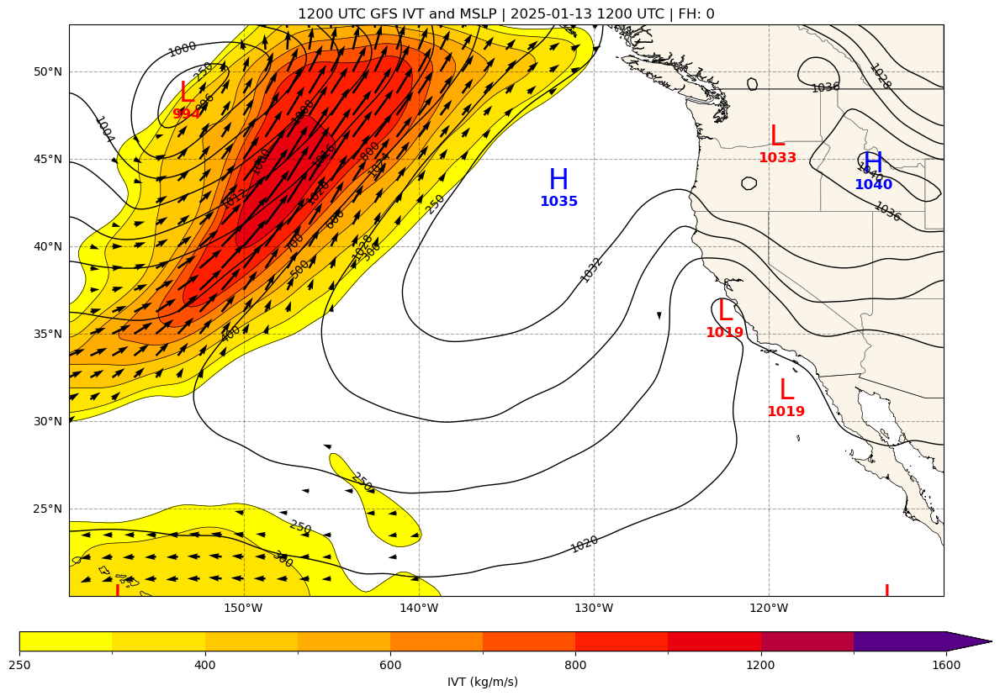

Time taken for iteration 0: 2.74 seconds


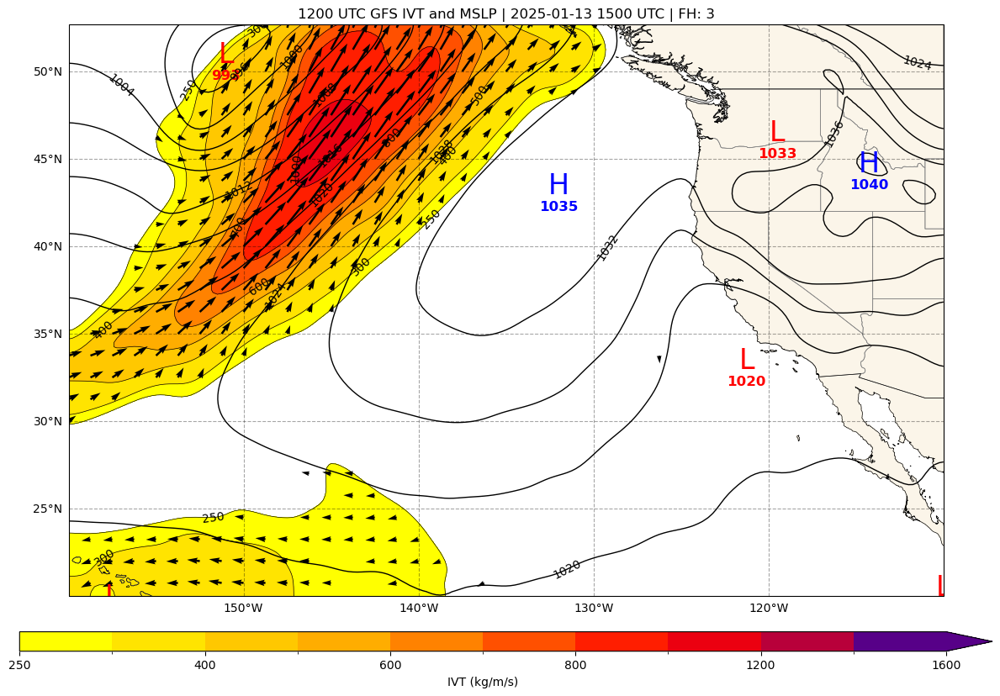

Time taken for iteration 1: 4.55 seconds


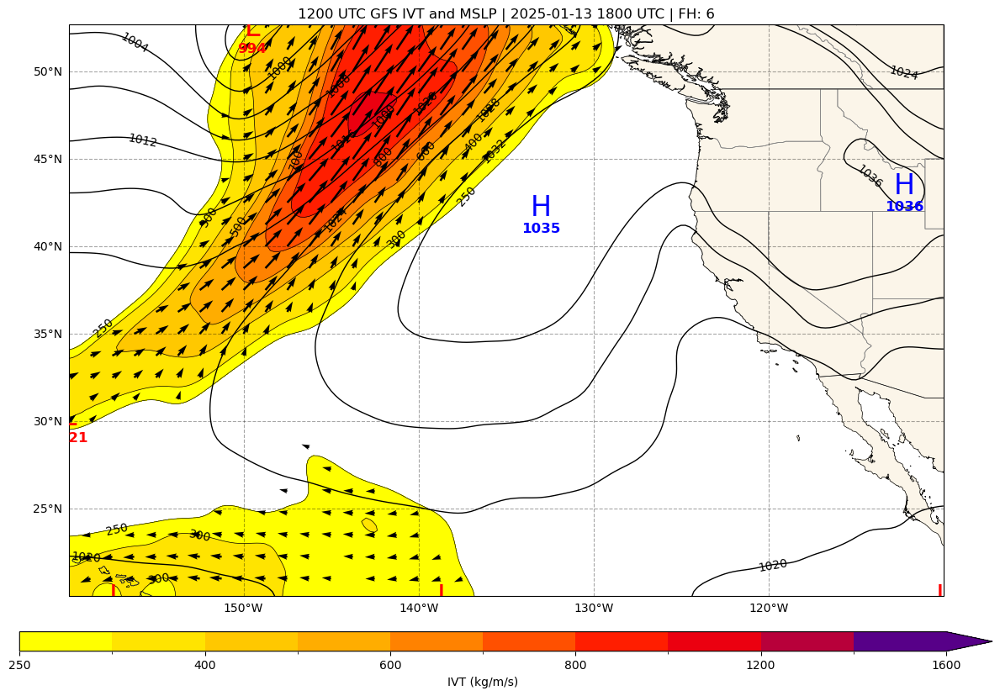

Time taken for iteration 2: 2.92 seconds
No contours to label for isobars.


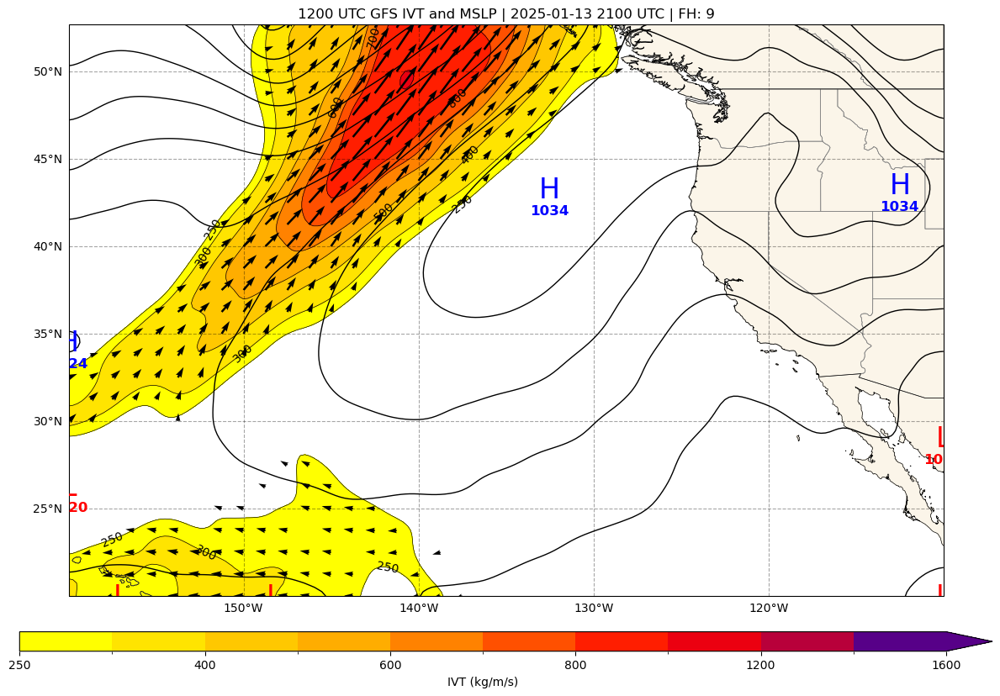

Time taken for iteration 3: 3.72 seconds


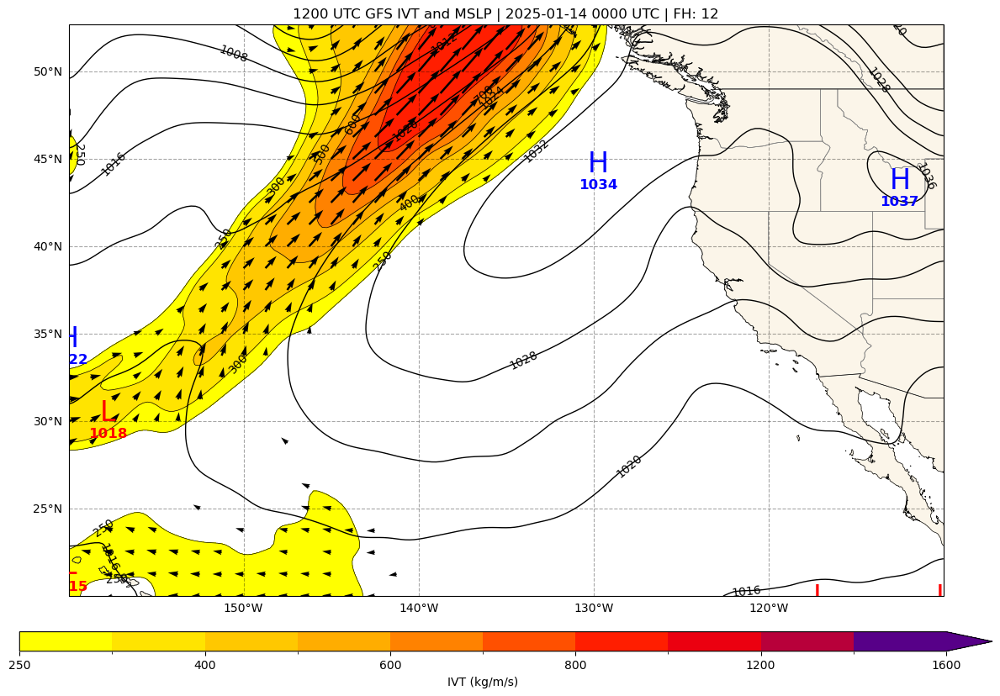

Time taken for iteration 4: 2.76 seconds


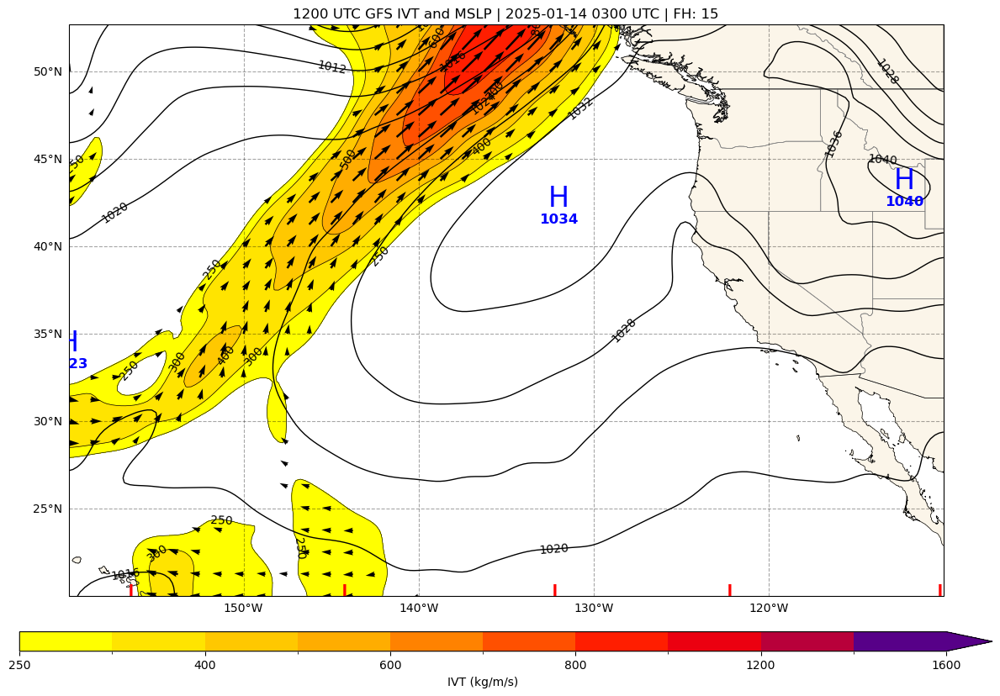

Time taken for iteration 5: 3.80 seconds


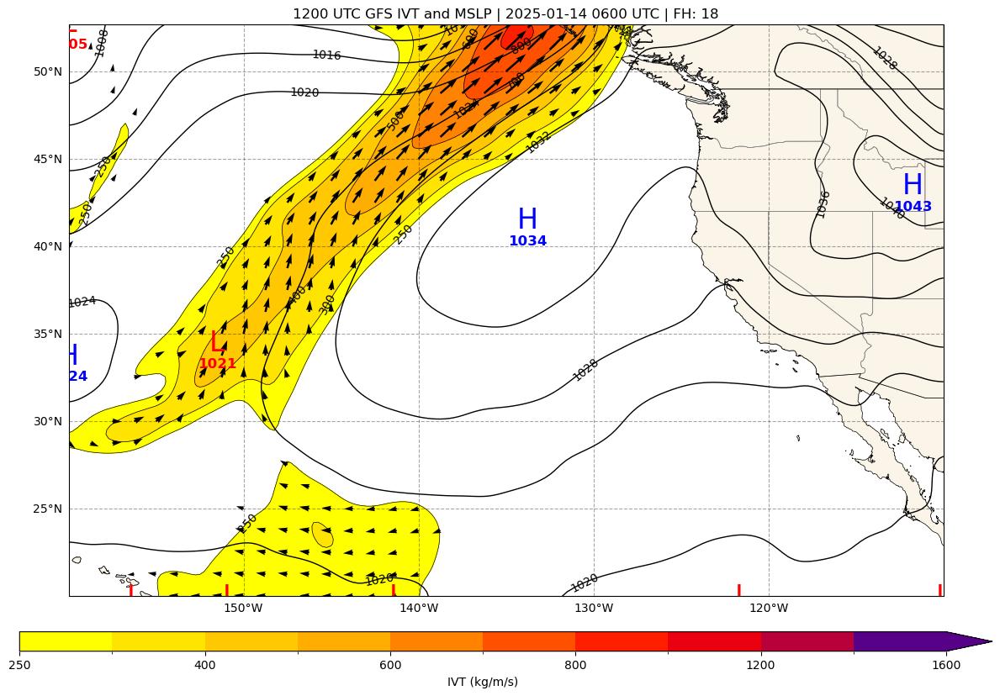

Time taken for iteration 6: 2.74 seconds


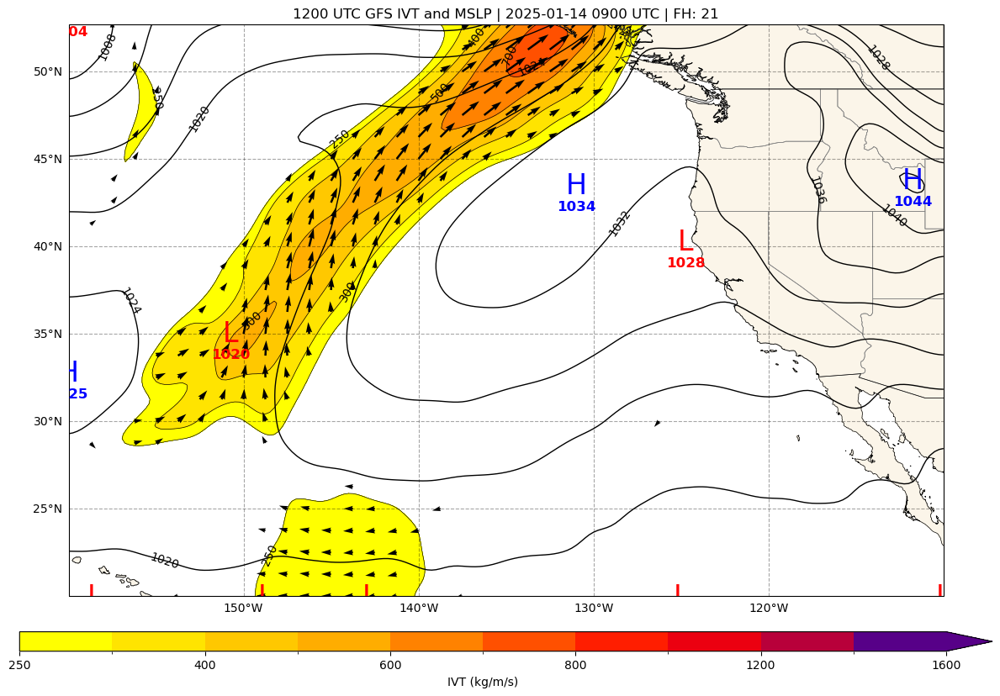

Time taken for iteration 7: 3.69 seconds


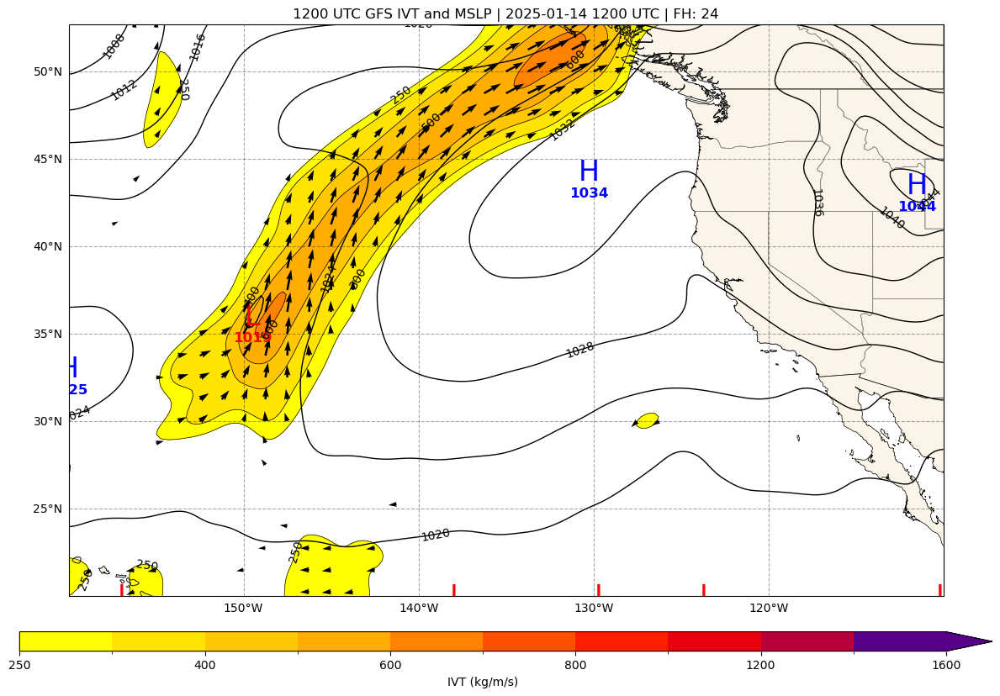

Time taken for iteration 8: 2.73 seconds


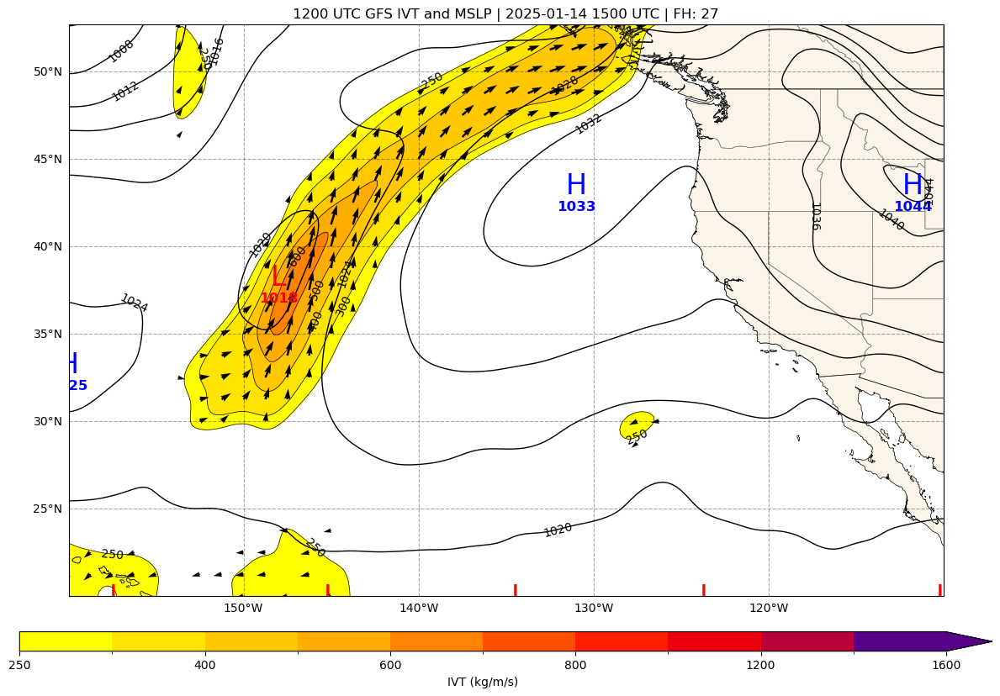

Time taken for iteration 9: 3.62 seconds


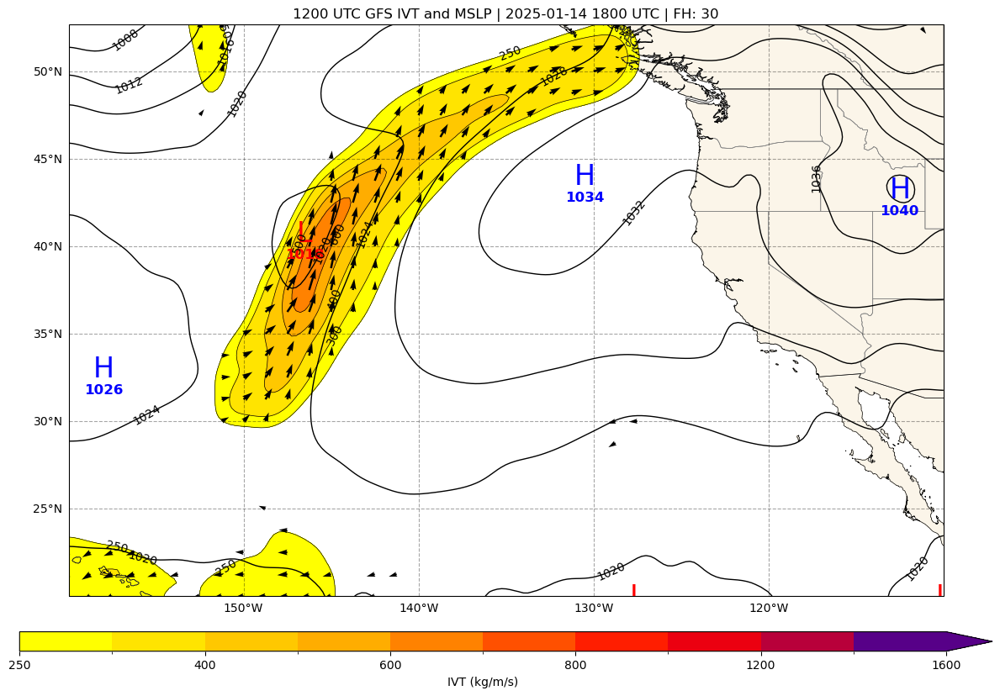

Time taken for iteration 10: 2.76 seconds


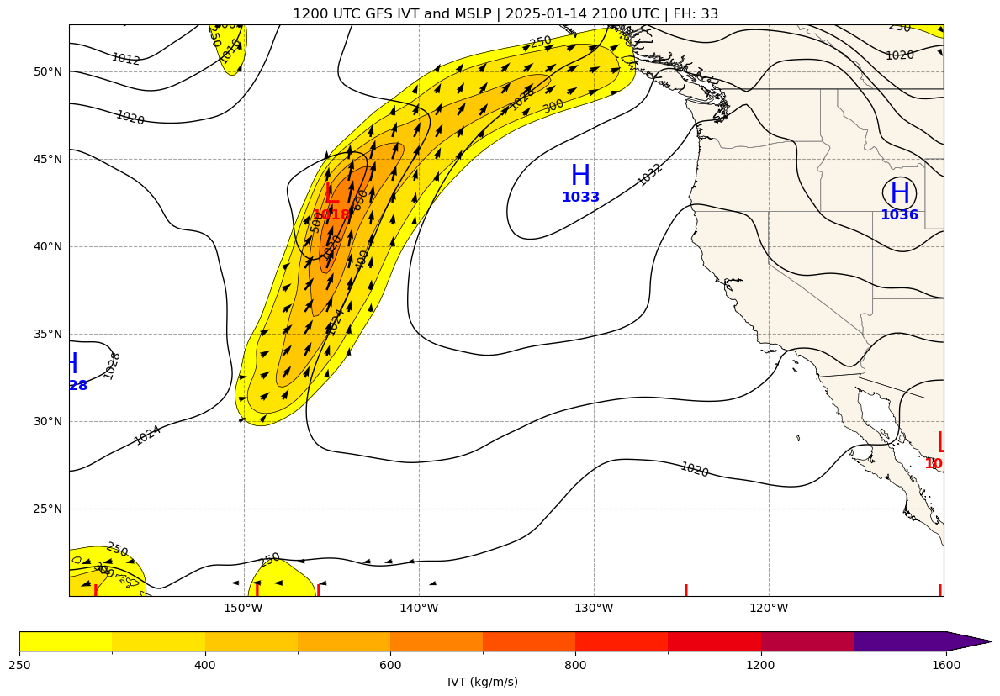

Time taken for iteration 11: 3.80 seconds


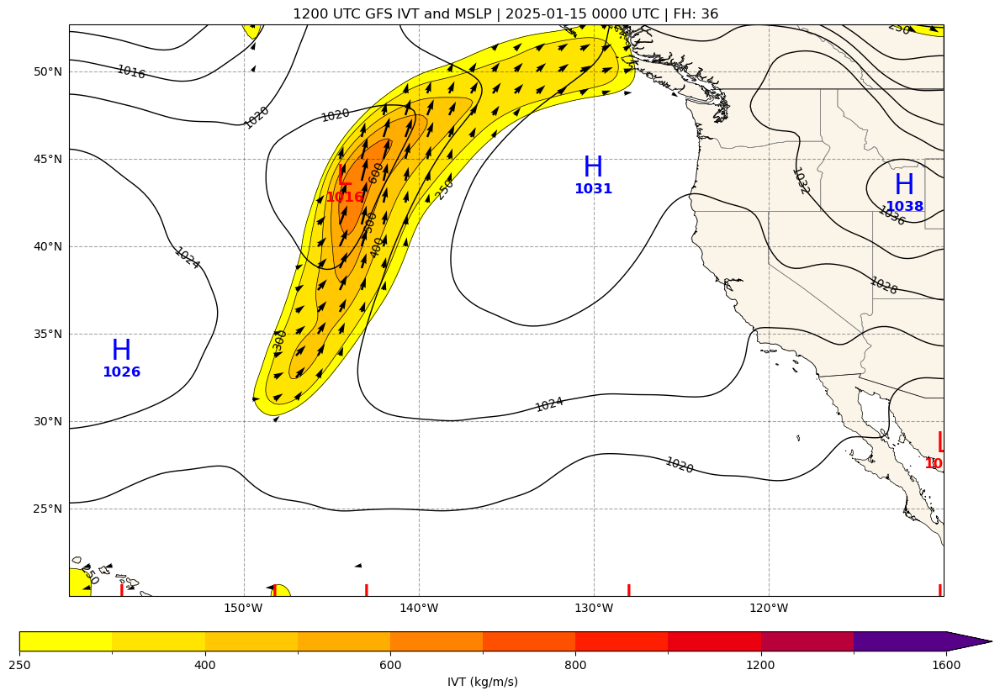

Time taken for iteration 12: 2.66 seconds


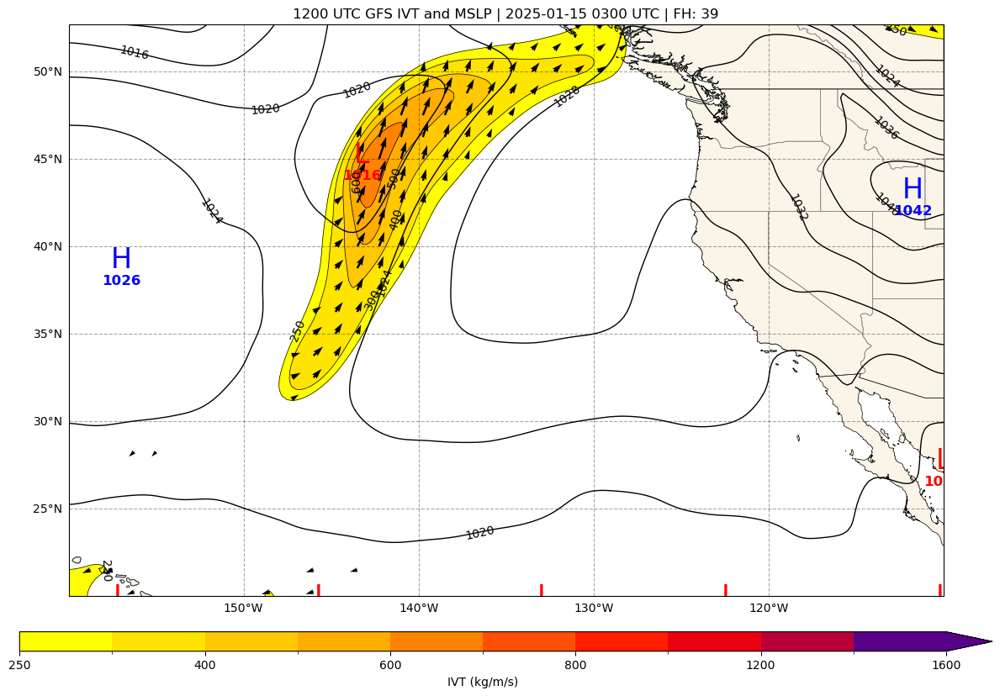

Time taken for iteration 13: 3.93 seconds


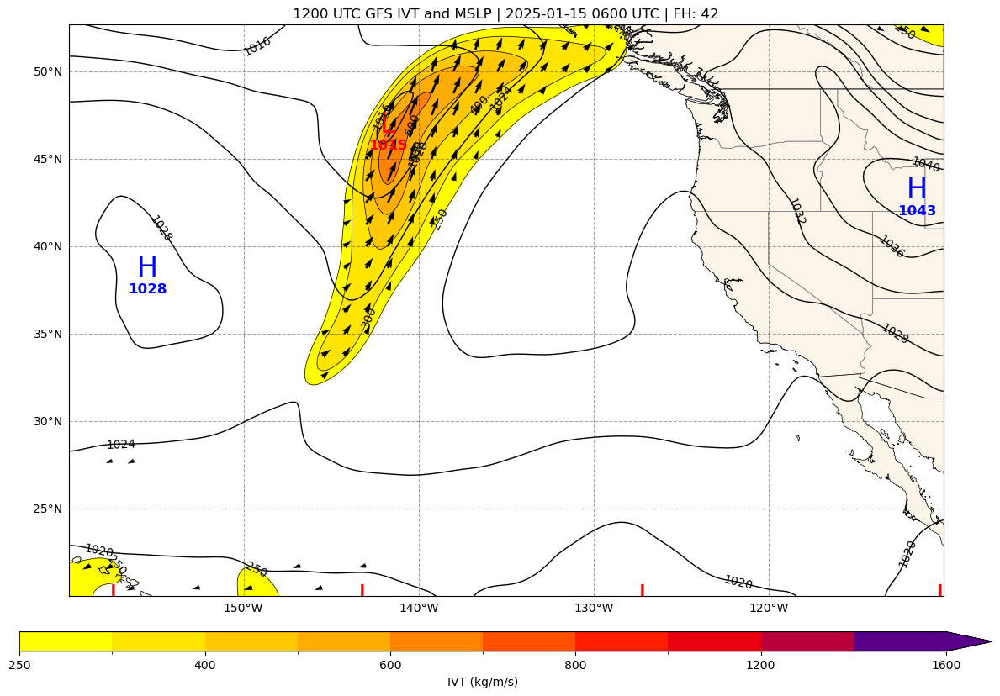

Time taken for iteration 14: 2.83 seconds


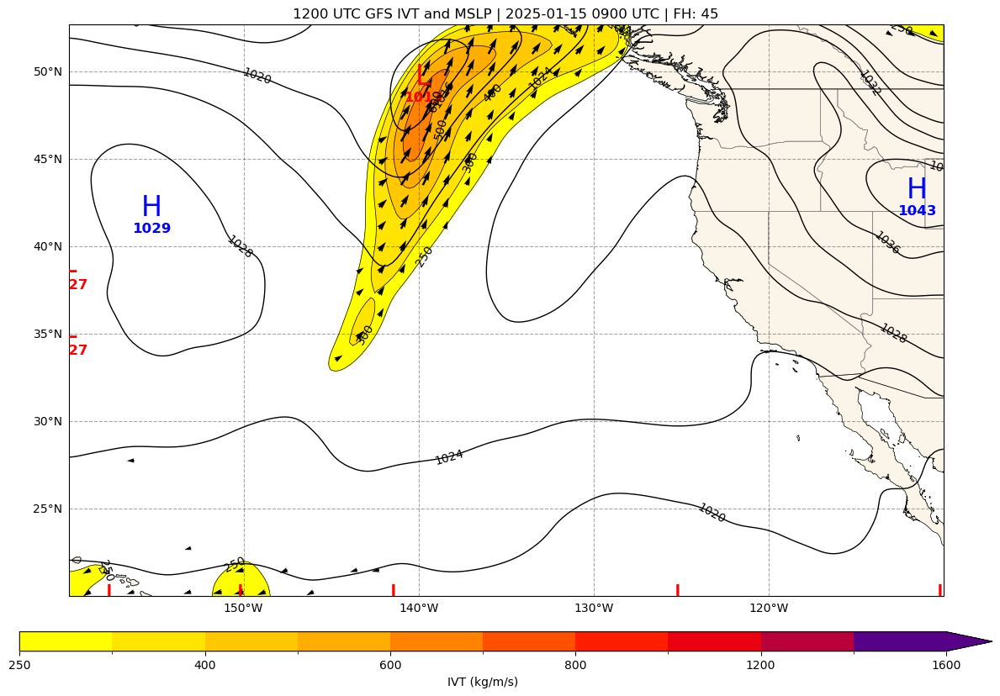

Time taken for iteration 15: 4.52 seconds


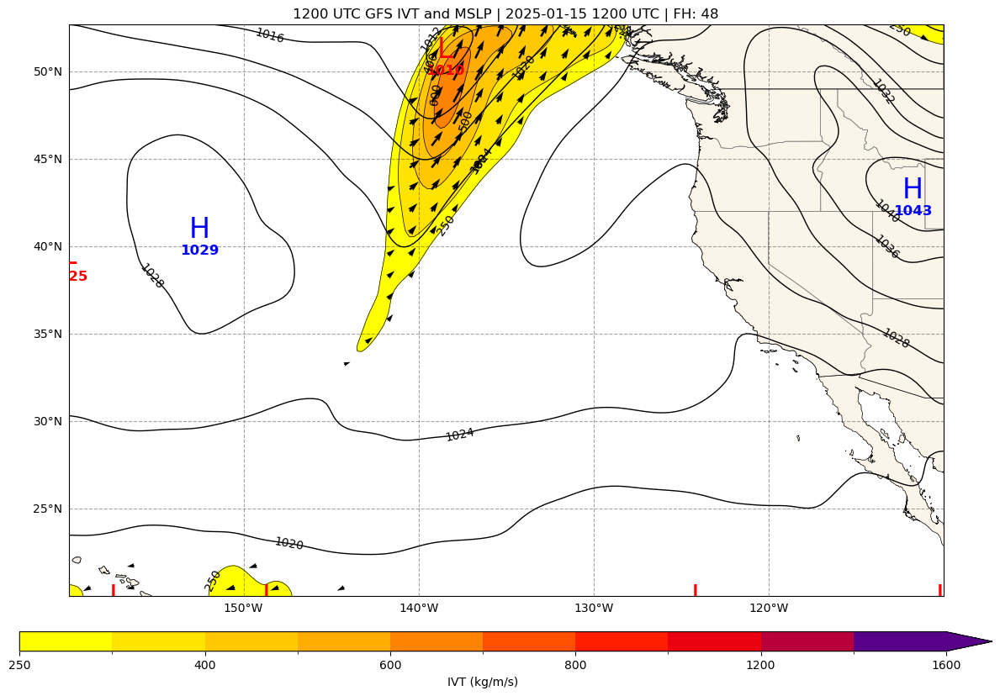

Time taken for iteration 16: 2.76 seconds


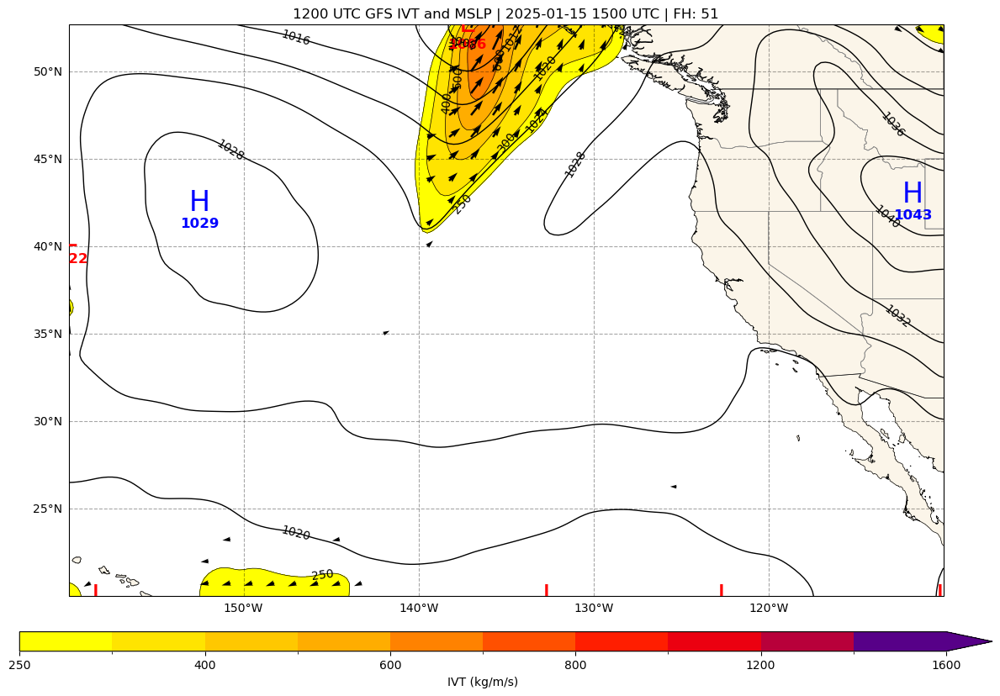

Time taken for iteration 17: 3.87 seconds


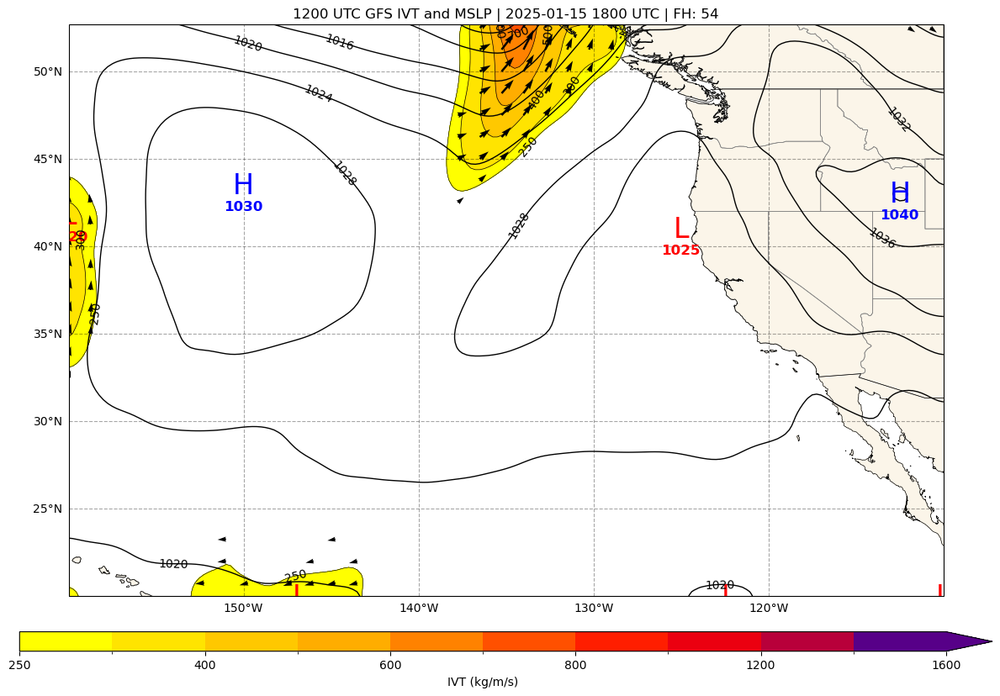

Time taken for iteration 18: 2.75 seconds


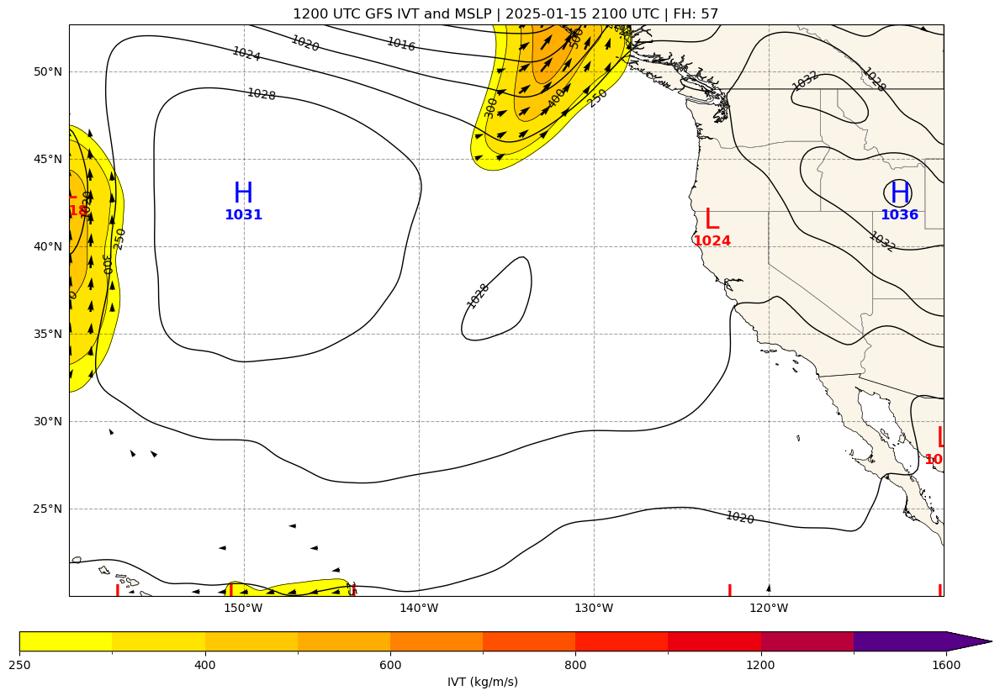

Time taken for iteration 19: 4.26 seconds


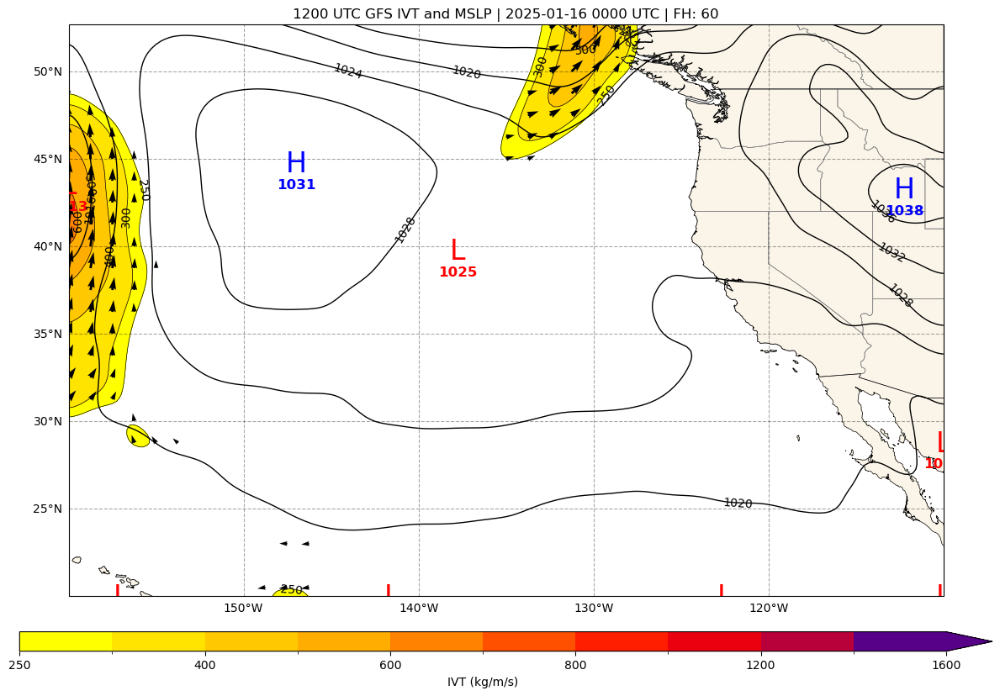

Time taken for iteration 20: 2.98 seconds


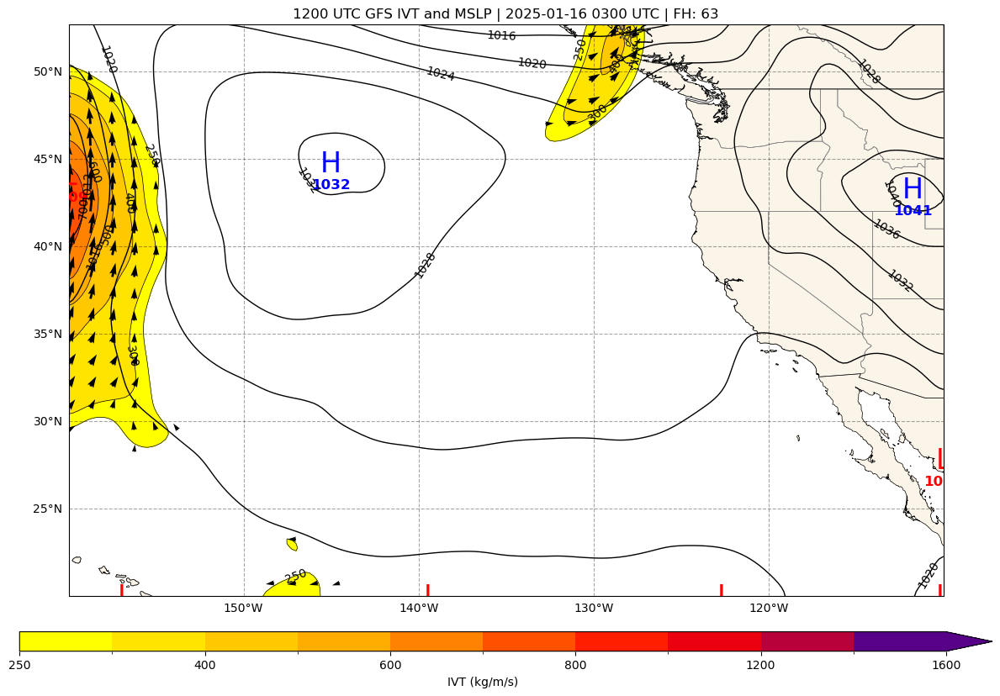

Time taken for iteration 21: 3.67 seconds


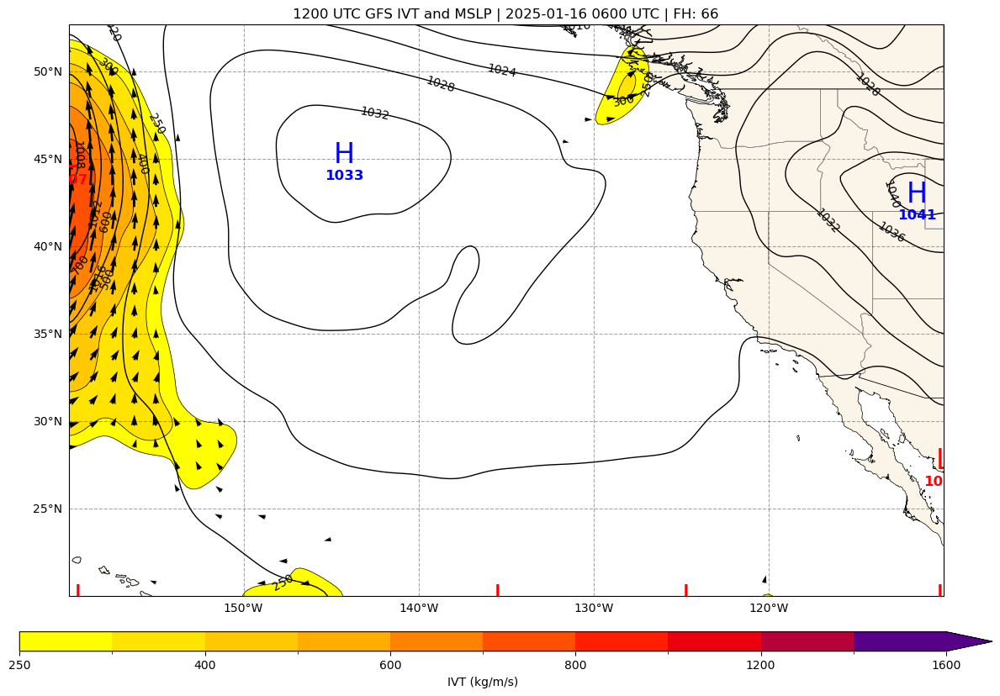

Time taken for iteration 22: 2.86 seconds


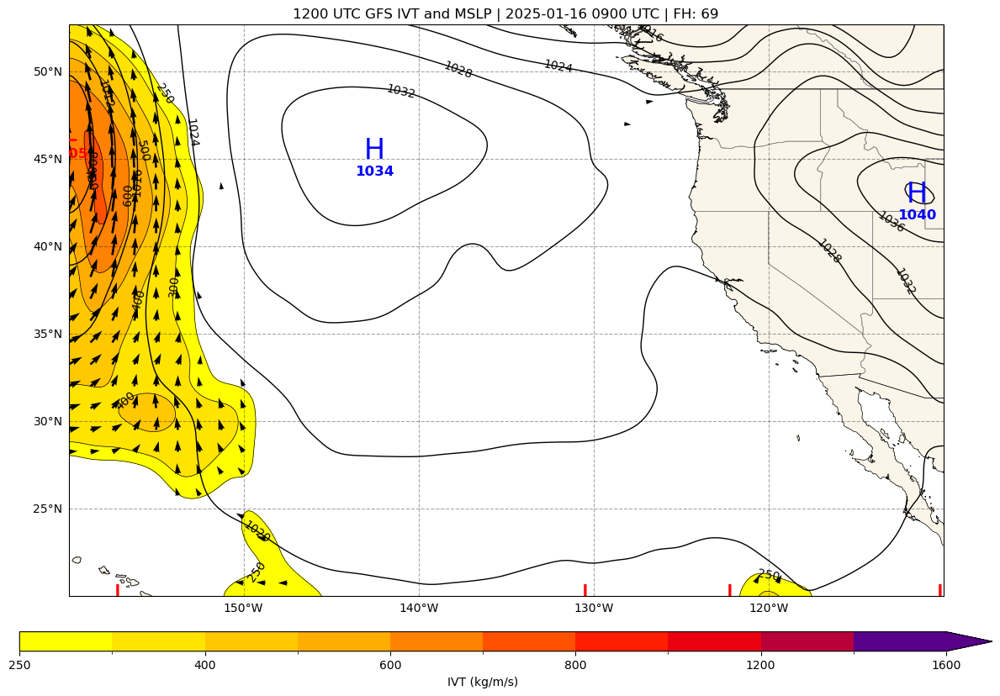

Time taken for iteration 23: 3.88 seconds


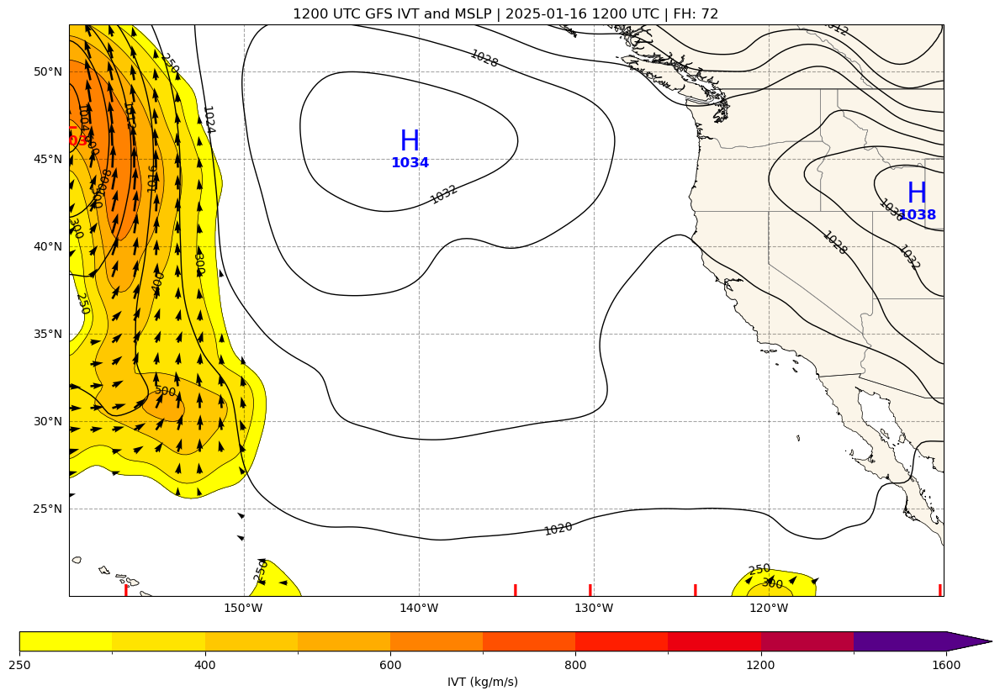

Time taken for iteration 24: 2.94 seconds


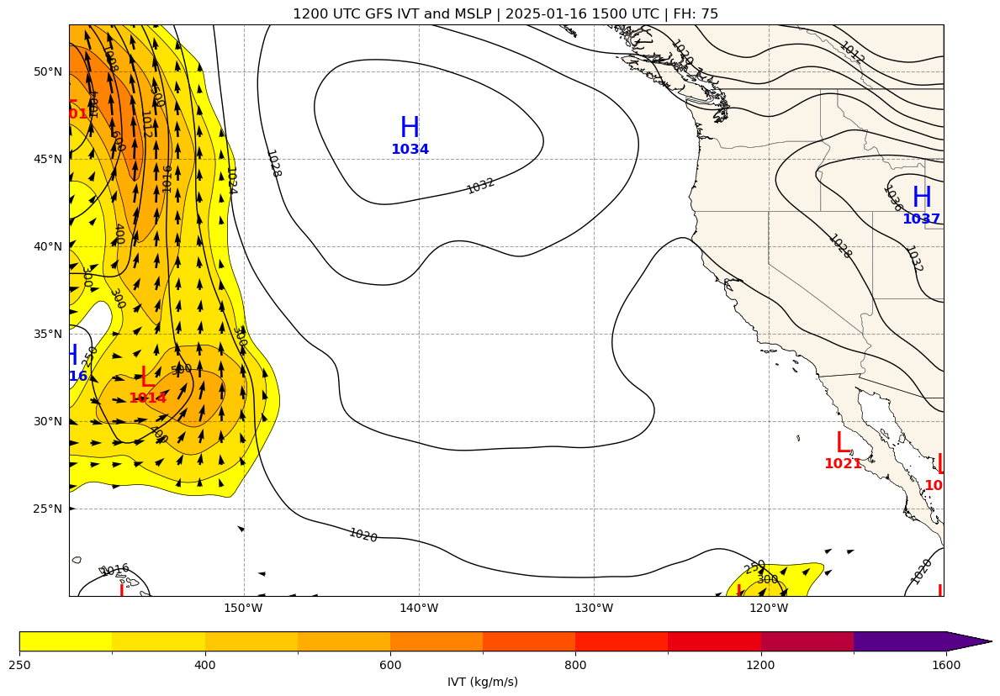

Time taken for iteration 25: 4.03 seconds


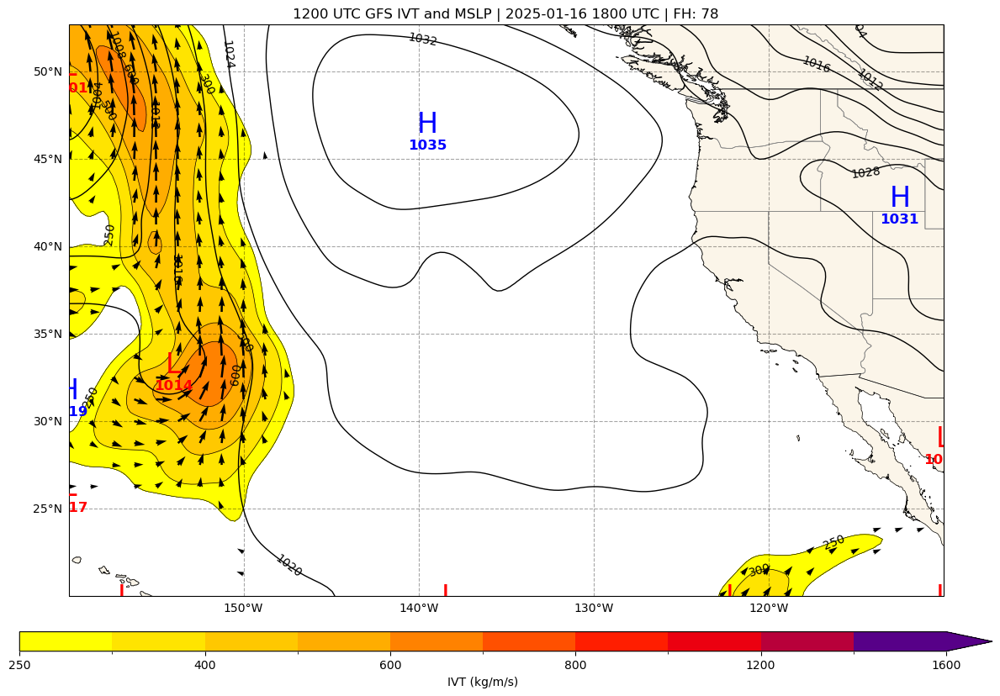

Time taken for iteration 26: 2.89 seconds


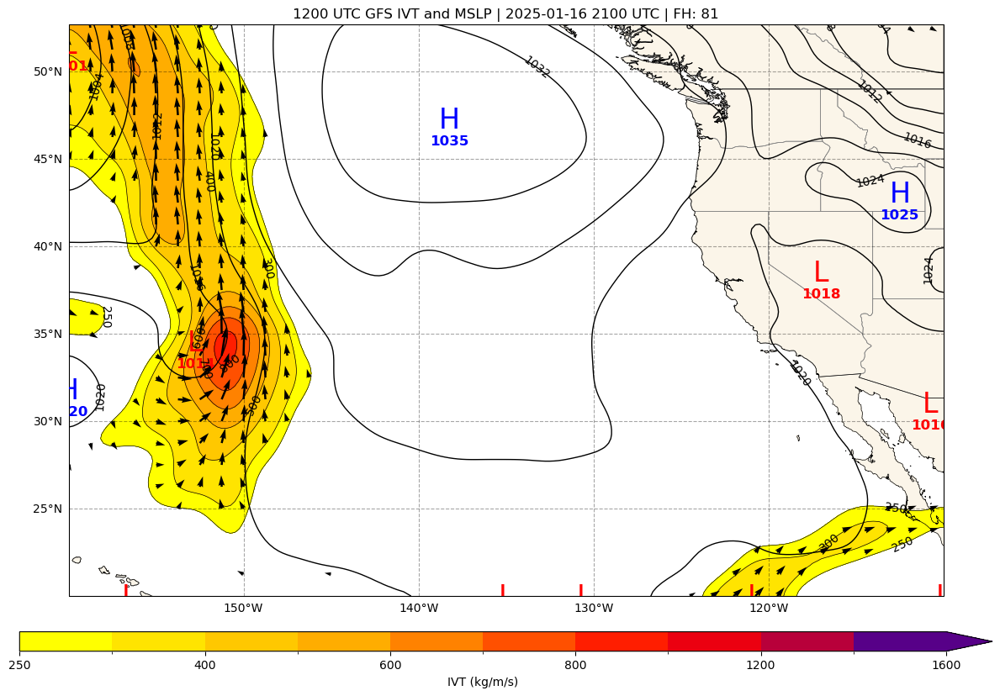

Time taken for iteration 27: 4.11 seconds


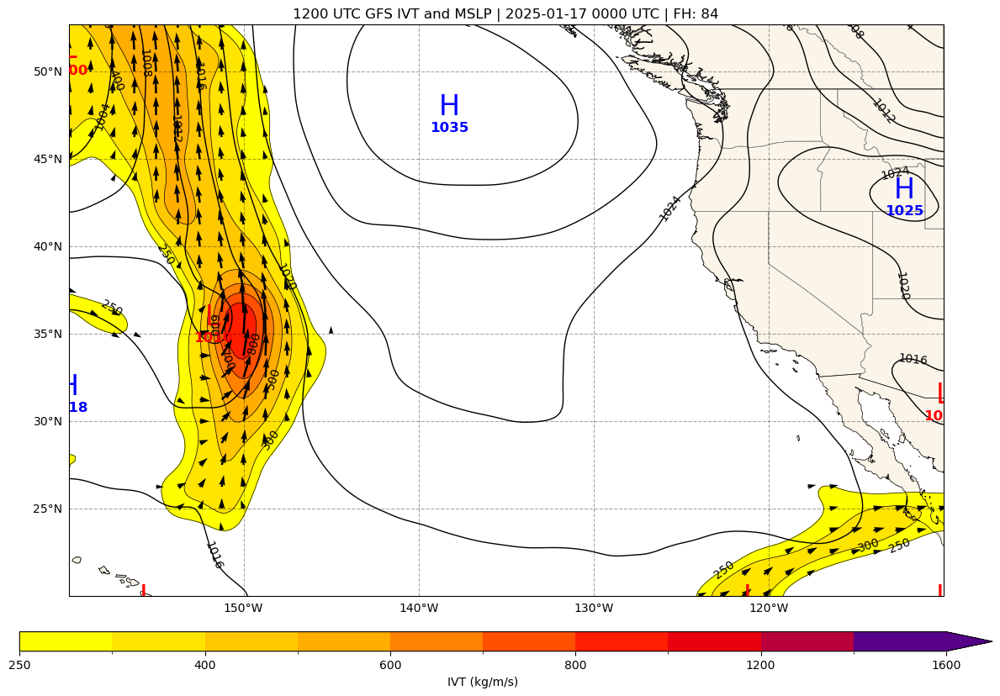

Time taken for iteration 28: 2.99 seconds


In [18]:
if __name__ == "__main__":
    directions = {'North': 55, 
                'East': 250, 
                'South': 20, 
                'West': 200} # units: degrees North, degrees East
    ds_latlon, matching_dim, init_time = gfs_data(directions)
    plot_ivt(ds_latlon, matching_dim, init_time, directions)